# Diabetes Prediction using Extreme Gradient Boosting

## I. Analysis 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from pylab import rcParams
rcParams['figure.figsize'] = 5, 4
# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'
%matplotlib inline


In [2]:
# load data
data = pd.read_csv('diabetes.csv')

In [3]:
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [5]:
#count the number of features and number of records
data.shape

(768, 9)

In [6]:
#count the outcome of each class.
data.groupby("Outcome").size()

Outcome
0    500
1    268
dtype: int64

In [7]:
# Draw pairplot of the data to show relationships.
pairplot = sns.pairplot(data, vars=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'], hue="Outcome", palette="mako")
pairplot.map_diag(plt.hist)
pairplot.map_upper(plt.scatter)
pairplot.map_lower(sns.kdeplot, shade=True, cmap=sns.cubehelix_palette(8, start=.5, rot=-.75, as_cmap=True))
pairplot.savefig("pairplot.png", dpi = 300)

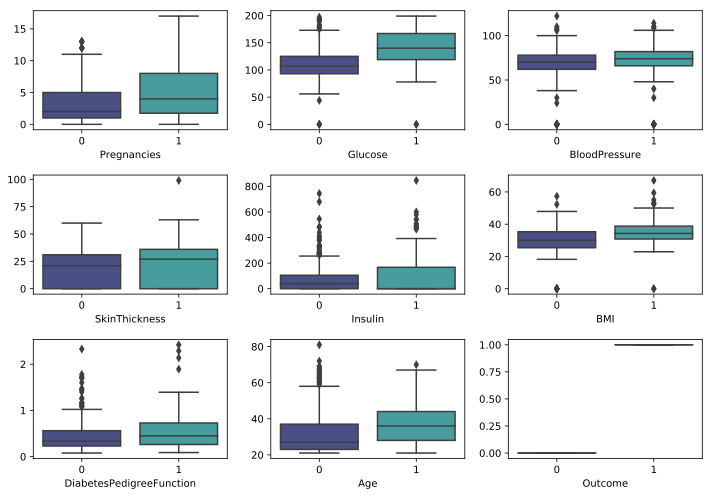

In [8]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10, 7))
for col, val in enumerate(data): 
    ax = axes[int(col / 3), col % 3] 
    sns.boxplot(x='Outcome', y=val, data=data, ax=ax, palette="mako") 
    ax.set_xlabel(val) 
    ax.set_ylabel('') 
fig.tight_layout();
fig.savefig("boxplot.png", dpi = 300)

In [9]:
data.columns[0:len(data)-1]

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [10]:
corr = data[data.columns].corr()

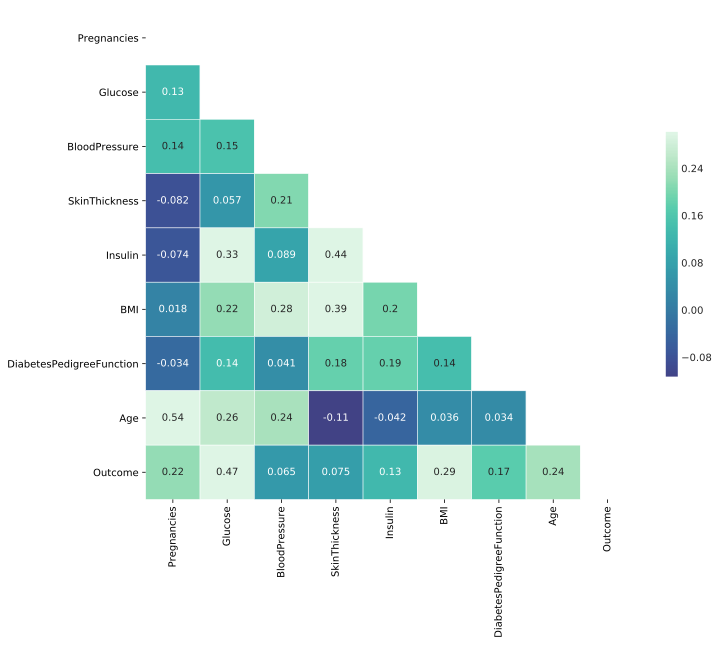

In [11]:
fig, axes = plt.subplots(figsize=(11, 9))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, center=0, cmap="mako",
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

fig.savefig("corrmap.png", dpi = 300)

## II. Data Preprocessing

In [12]:
## By looking at the data in the visualizations above, we can clearly see the following: 
## 1. There is one outlier in the "Skin thickness" we have to remove it because it is most likely mistyped. 
data = data[data.SkinThickness!=data.SkinThickness.max()]
## 2. "Glucose","BMI", "Insulin", "Blood Pressure" and "Skin thickness" has zero values which is medically not possible:
##    In this case, we have two options to solve this: a. Remove the zero values, b. replace zero value with the mean. 
##    I will go with option B, because changing it to the mean will not affect the outcome and will keep the data.
mean_Glucose = data.Glucose.mean(skipna=True)
mean_BMI = data.BMI.mean(skipna=True)
mean_Insulin = data.Insulin.mean(skipna=True)
mean_BloodPressure = data.BloodPressure.mean(skipna=True)
mean_SkinThickness = data.SkinThickness.mean(skipna=True)

data['Glucose']=data.Glucose.mask(data.Glucose == 0,mean_Glucose)
data['BMI']=data.BMI.mask(data.BMI == 0,mean_BMI)
data['Insulin']=data.Insulin.mask(data.Insulin == 0,mean_Insulin)
data['BloodPressure']=data.BloodPressure.mask(data.BloodPressure == 0,mean_BloodPressure)
data['SkinThickness']=data.SkinThickness.mask(data.SkinThickness == 0,mean_SkinThickness)

In [13]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000
mean,3.847458,121.582759,72.257693,26.481818,118.761425,32.447822,0.471742,33.203390,0.348110
std,3.371117,30.333906,12.123577,9.294927,93.109342,6.879383,0.331524,11.721879,0.476682
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.500000,64.000000,20.434159,79.903520,27.500000,0.243500,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,79.903520,32.000000,0.371000,29.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,127.500000,36.600000,0.626500,41.000000,1.000000
max,17.000000,199.000000,122.000000,63.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [14]:
from sklearn.model_selection import train_test_split
# Prepare data for training
features = list(data.columns.values)
features.remove('Outcome')
## After investigating the data and the model, I found that the glucose, BMI and Age combination gives the most accurate result.
features.remove('SkinThickness')
features.remove('BloodPressure')
features.remove('Insulin')
features.remove('DiabetesPedigreeFunction')
features.remove('Pregnancies')
X = data[features]
y = data['Outcome']

X.head()


,Glucose,BMI,Age
0,148.0,33.6,50
1,85.0,26.6,31
2,183.0,23.3,32
3,89.0,28.1,21
4,137.0,43.1,33


## III. Implementation

In [15]:
import xgboost 
# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=7)

/anaconda3/envs/ml/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [16]:
model = xgboost.XGBClassifier(max_depth=3, learning_rate=0.005, n_estimators=500)
model.fit(X_train, y_train)
prediction = model.predict(X_test)

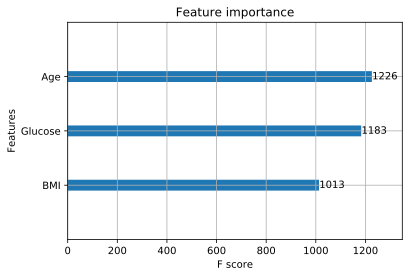

In [17]:
# Importance of the used features
xgboost.plot_importance(model)


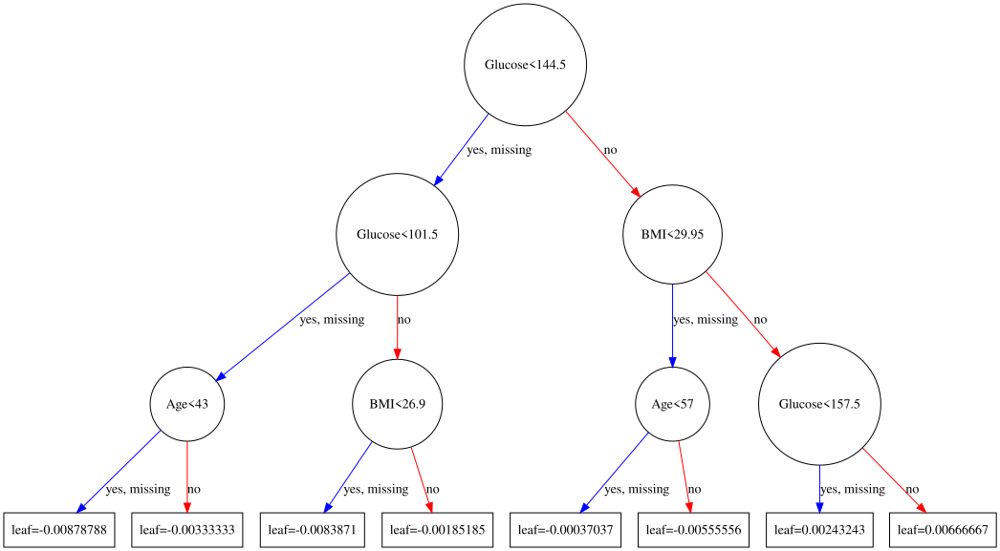

In [18]:
xgboost.to_graphviz(model)

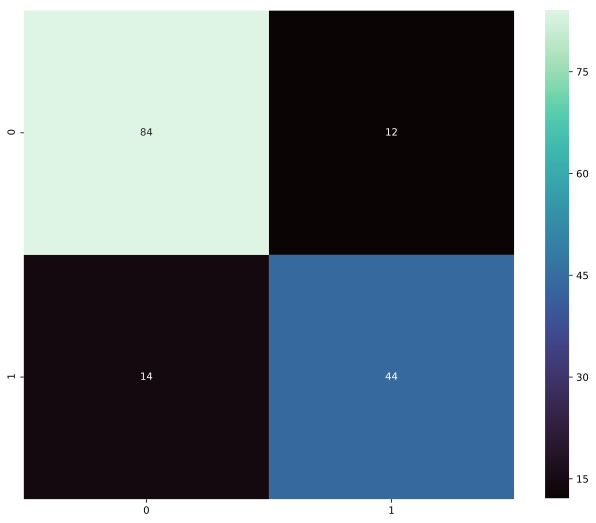

In [19]:
from sklearn.metrics import confusion_matrix
fig, axes = plt.subplots(figsize=(11, 9))
sns.heatmap( confusion_matrix(y_test, prediction), annot=True, xticklabels=[0,1], yticklabels=[0,1], cmap="mako")
fig.savefig("res_corrmap.png", dpi = 300)

In [20]:
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction, target_names=["0","1"] ))

             precision    recall  f1-score   support

          0       0.86      0.88      0.87        96
          1       0.79      0.76      0.77        58

avg / total       0.83      0.83      0.83       154



In [21]:
# k-fold cross validation evaluation of xgboost model
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
# CV model
kfold = KFold(n_splits=10, random_state=7)
results = cross_val_score(model, X, y, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 76.54% (7.75%)
